Higor Grigorio dos Santos - BI3007511

# Trasformações de Intesidade

Utilizar as imagens Fig 3.8 e enhance-me.gif disponíveis no Moodle
Aplicar a transformação logarítmica, testar vários valores para o parâmetro c "s = c log (1 + r)"
Aplicar a transformação de potência (gama), testar vários valores para o parâmetro γ e c=1 "s = crγ"
Implemente a representação de cada plano de bits das imagens
Implementar a equalização do histograma
Elaborar relatório explicando a implementação de cada transformação e qual foi o efeito na imagem.

In [1]:
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image, ImageFilter

enhance_me = Image.open('enhance-me.gif')
enhance_me = enhance_me.convert('L')

# apply median filter in image
enhance_me = enhance_me.filter(ImageFilter.MedianFilter(5))

fig_3_8 = Image.open('Fig0308.tif')
fig_3_8 = fig_3_8.convert('L')


def plot_result(original, transformed, *args):
    fig, axs = plt.subplots(1, 2, figsize=(15, 15))
    axs[0].imshow(original, cmap='gray')
    axs[0].set_title('Original')
    axs[1].imshow(transformed, cmap='gray')
    axs[1].set_title('Transformed with {}'.format(args))


def process(img, transformation, *args):
    transformed = transformation(img, *args)
    plot_result(img, transformed, *args)

1. Aplicar a transformação logarítmica, testar vários valores para o parâmetro c "s = c log (1 + r)"

A transformação logarítmica é dada da seguinte forma para cada pixel da imagem:
<br>

<center>
$g(x, y) = c * log(1 + f(x, y))$
</center>

Onde.
  - $c$ é um parâmetro que pode ser ajustado para melhorar o contraste da imagem.
  - $f(x, y)$ é o valor do pixel na posição $(x, y)$ da imagem original.
  - $g(x, y)$ é o valor do pixel na posição $(x, y)$ da imagem transformada.


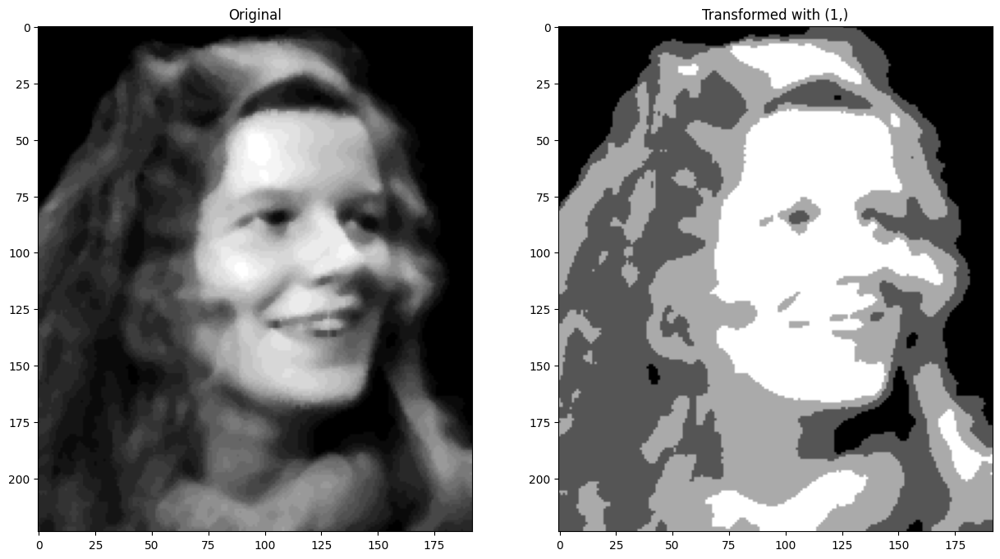

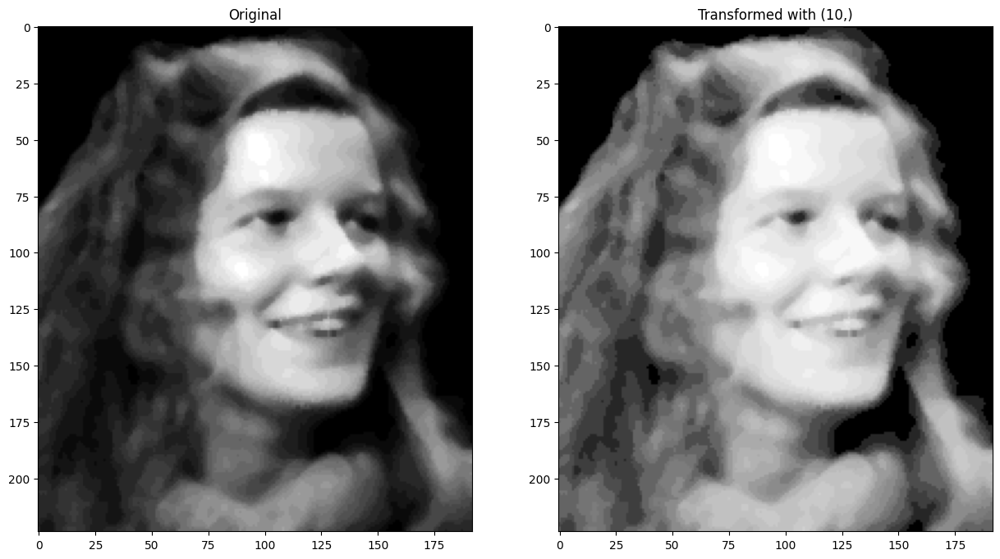

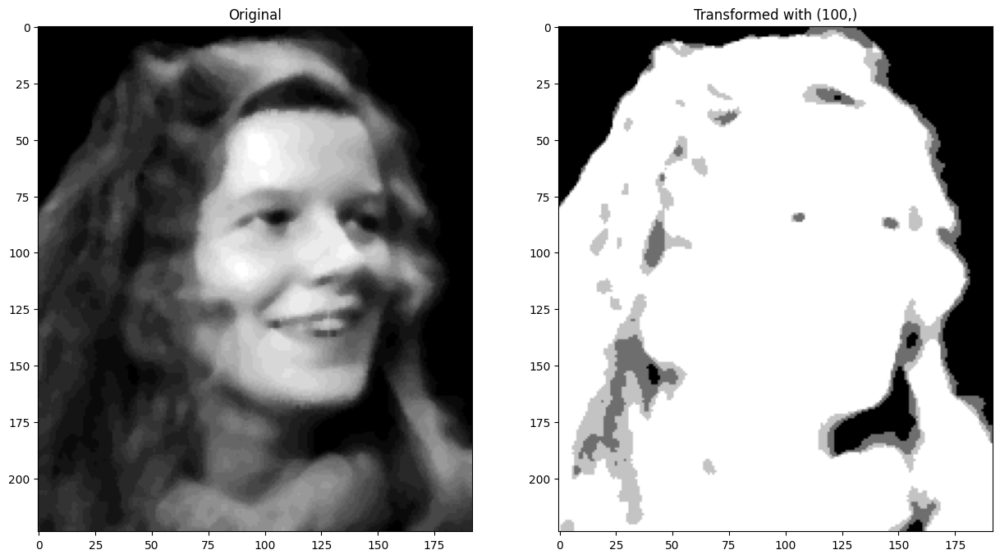

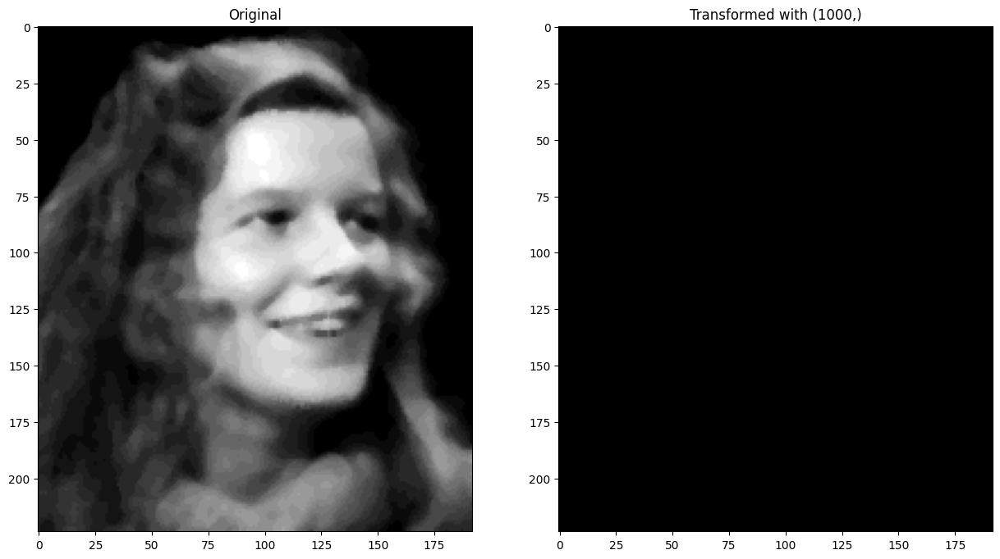

In [2]:

def apply_log_transformation(img, c):
    img = np.array(img)
    img = c * np.log2(1 + img)
    img = np.clip(img, 0, 255)
    img = Image.fromarray(img.astype(np.uint8))
    return img


#testando valores de c = 1, 10, 100, 1000 para enhance_me
for value in [1, 10, 100, 1000]:
    process(enhance_me, apply_log_transformation, value)

C:\Users\higor\AppData\Local\Temp\ipykernel_6468\3461176745.py:3: RuntimeWarning: divide by zero encountered in log2
  img = c * np.log2(1 + img)


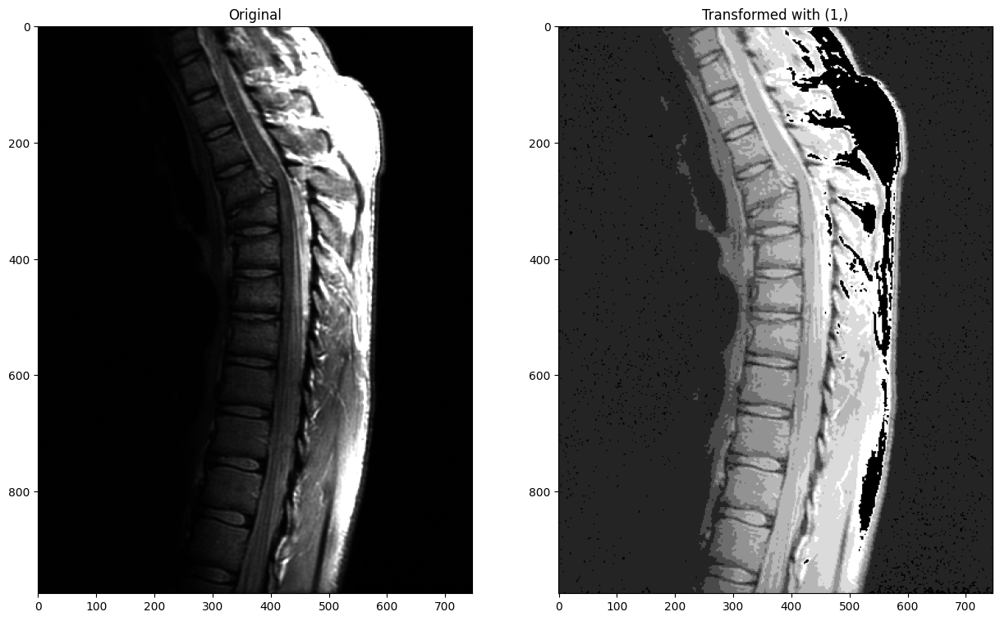

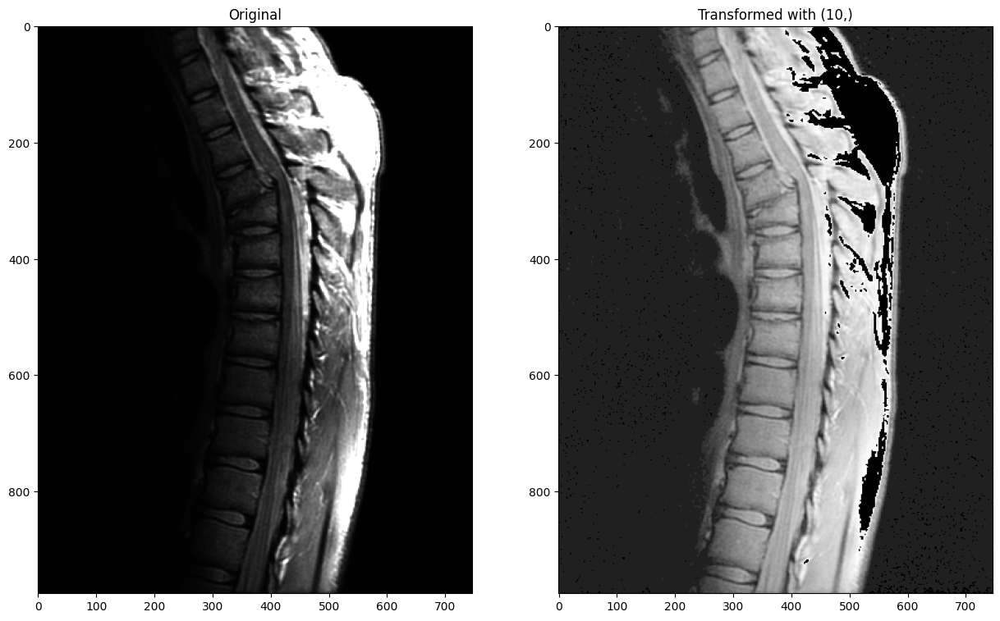

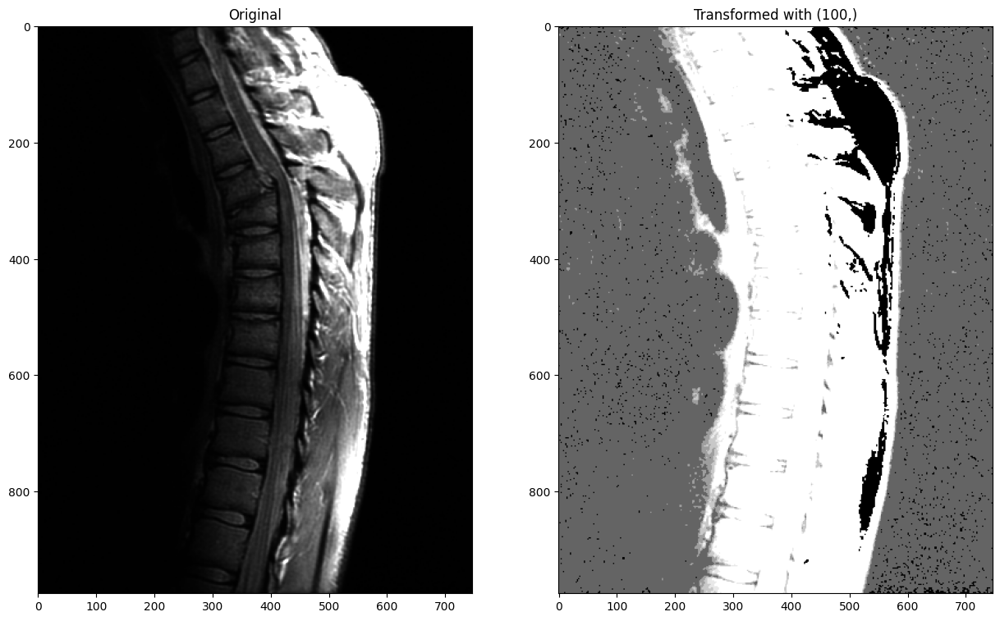

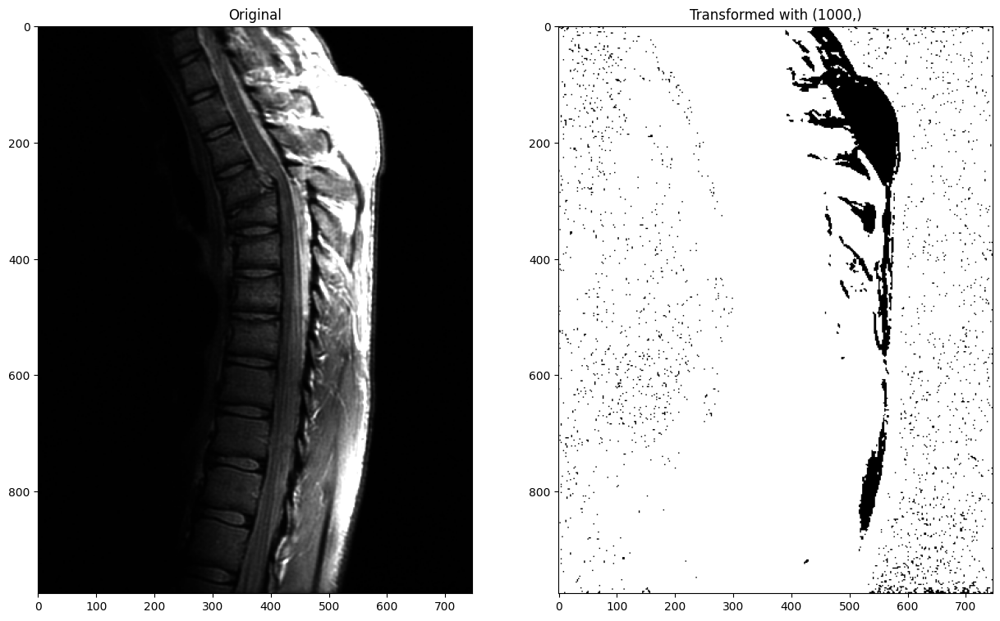

In [3]:
# testando valores
for value in [1, 10, 100, 1000]:
    process(fig_3_8, apply_log_transformation, value)

2. Aplicar a transformação de potência (gama), testar vários valores para o parâmetro γ e c=1 "s = crγ"

A transformação de potência é dada da seguinte forma para cada pixel da imagem:
<br>
<center>
$g(x, y) = c * f(x, y)^{\gamma}$
</center>

Onde.
  - $c$ é um parâmetro que pode ser ajustado para melhorar o contraste da imagem.
  - $\gamma$ é um parâmetro que pode ser ajustado para melhorar o contraste da imagem.
  - $f(x, y)$ é o valor do pixel na posição $(x, y)$ da imagem original.
  - $g(x, y)$ é o valor do pixel na posição $(x, y)$ da imagem transformada.

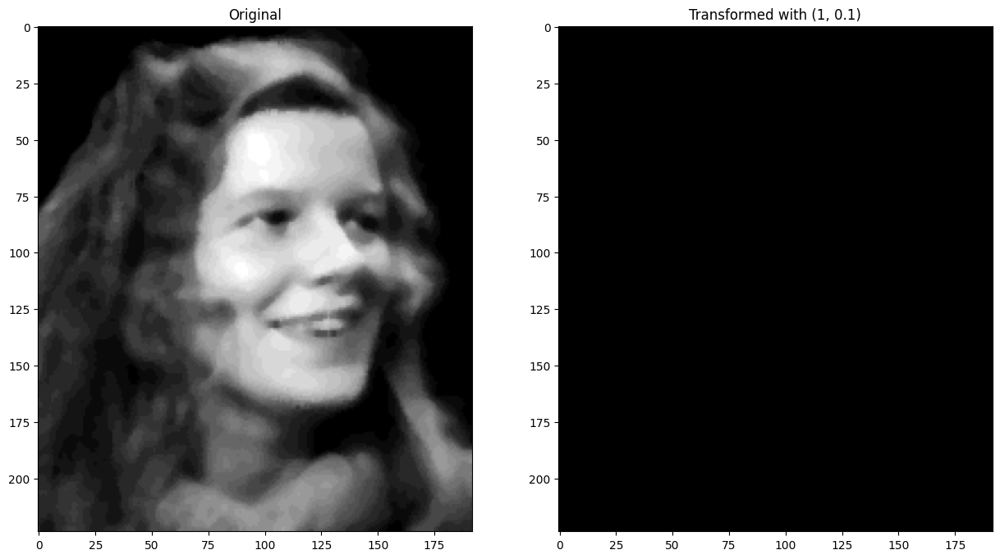

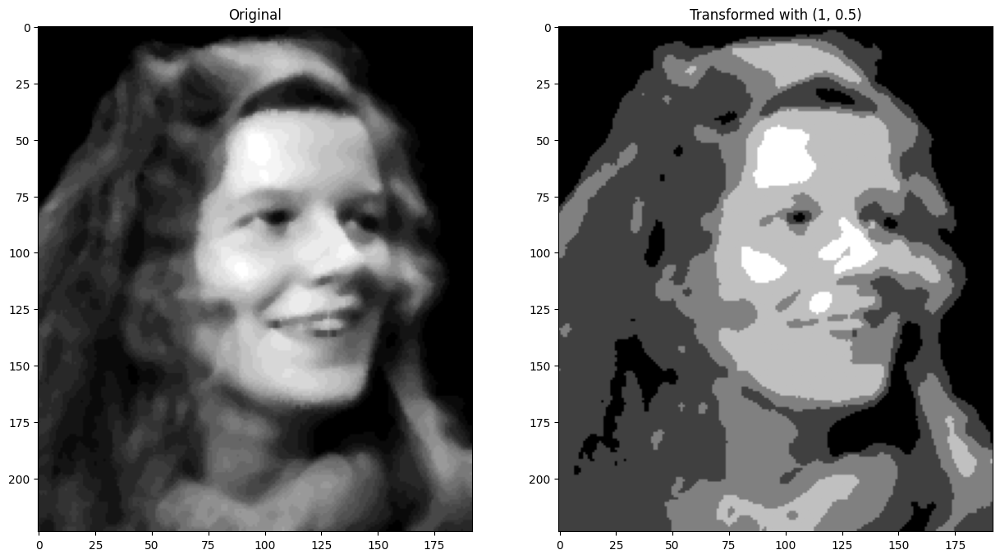

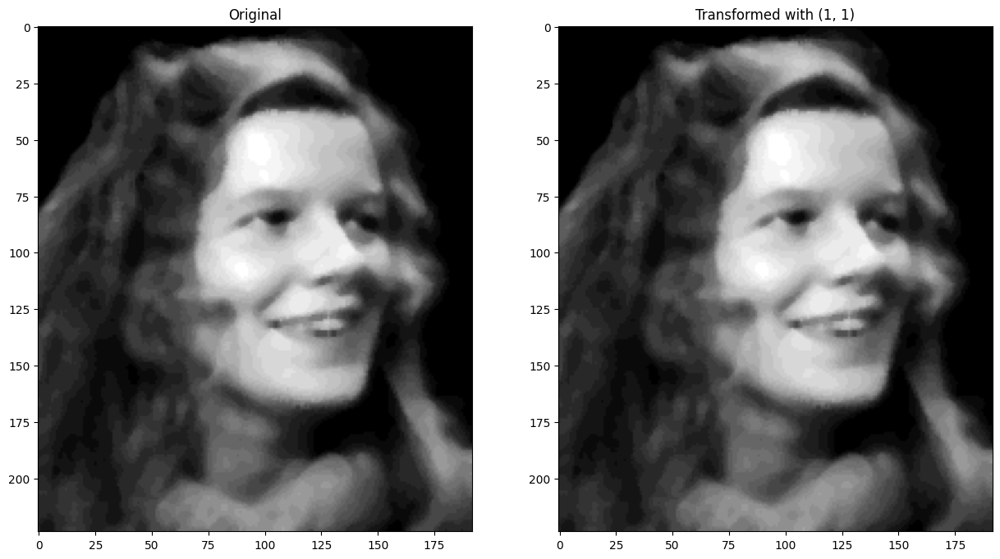

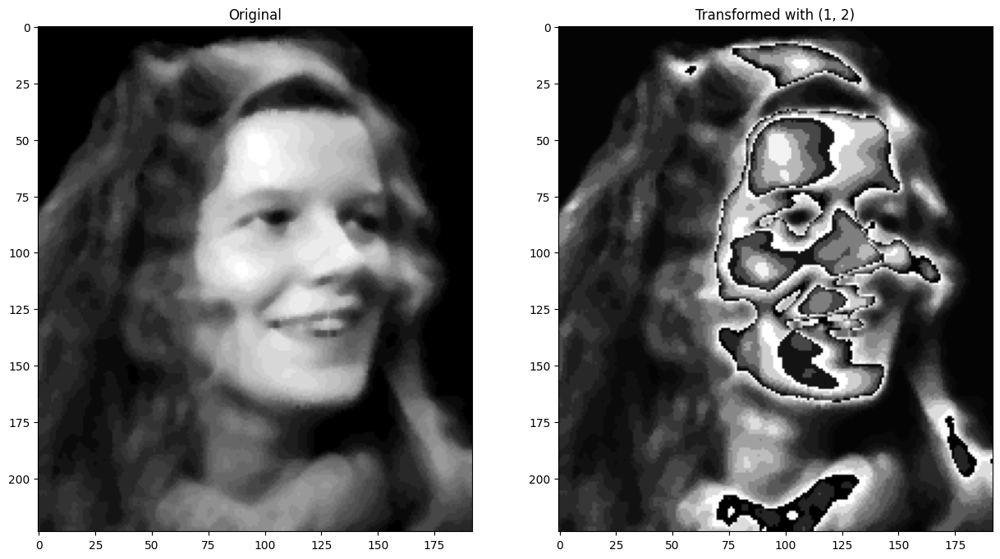

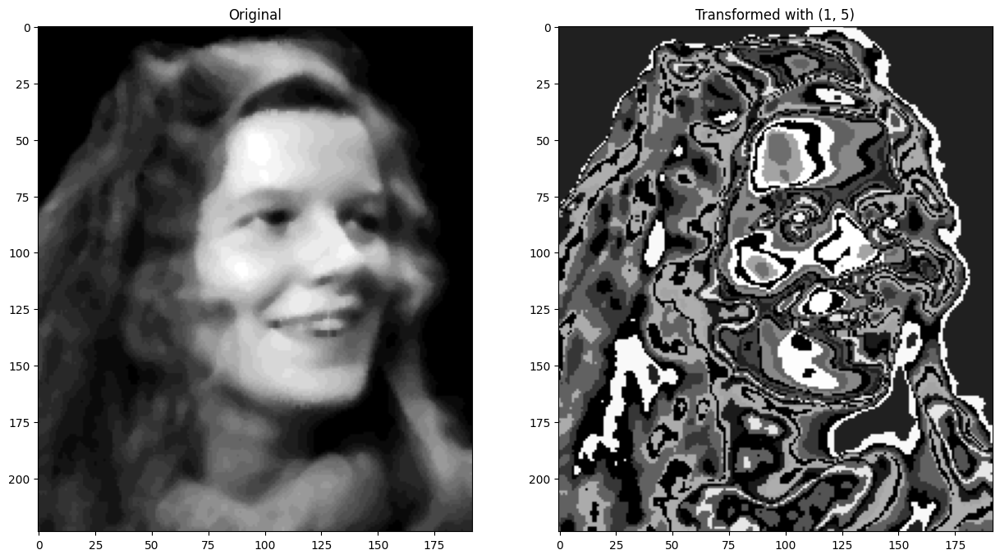

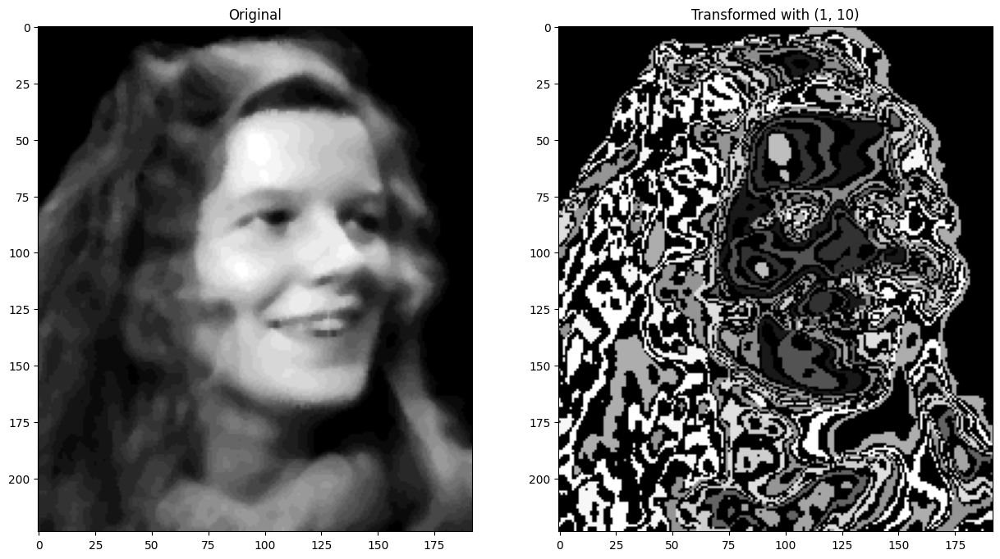

In [4]:
def apply_gamma_transformation(img, c, gamma):
    img = np.array(img)
    img = c * np.power(img, gamma)
    img = np.clip(img, 0, 255)
    img = Image.fromarray(img.astype(np.uint8))
    return img


#testando valores de gamma = 0.1, 0.5, 1, 2, 5, 10 para enhance_me
for value in [0.1, 0.5, 1, 2, 5, 10]:
    process(enhance_me, apply_gamma_transformation, 1, value)

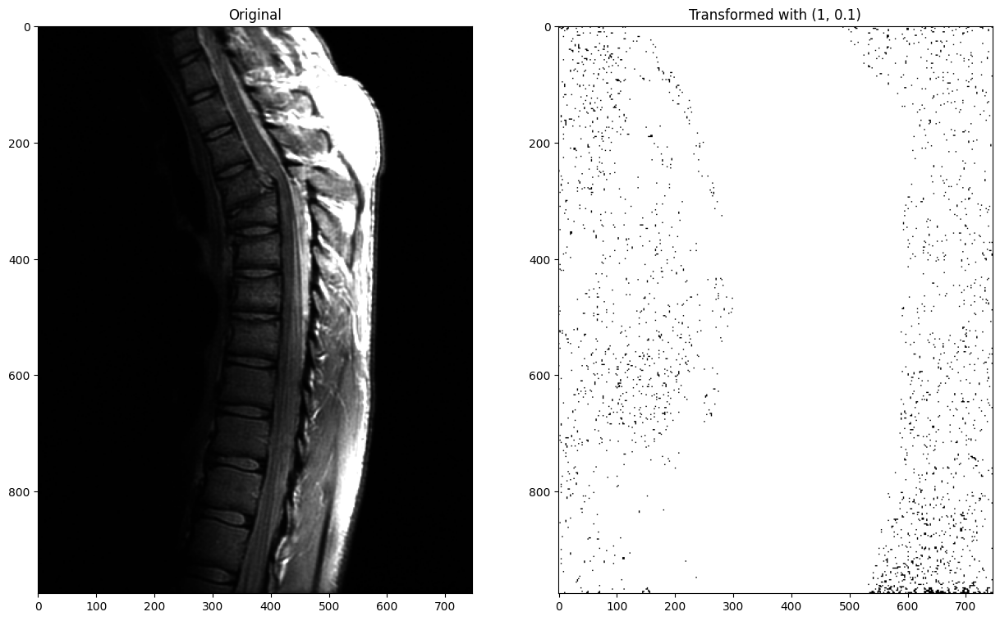

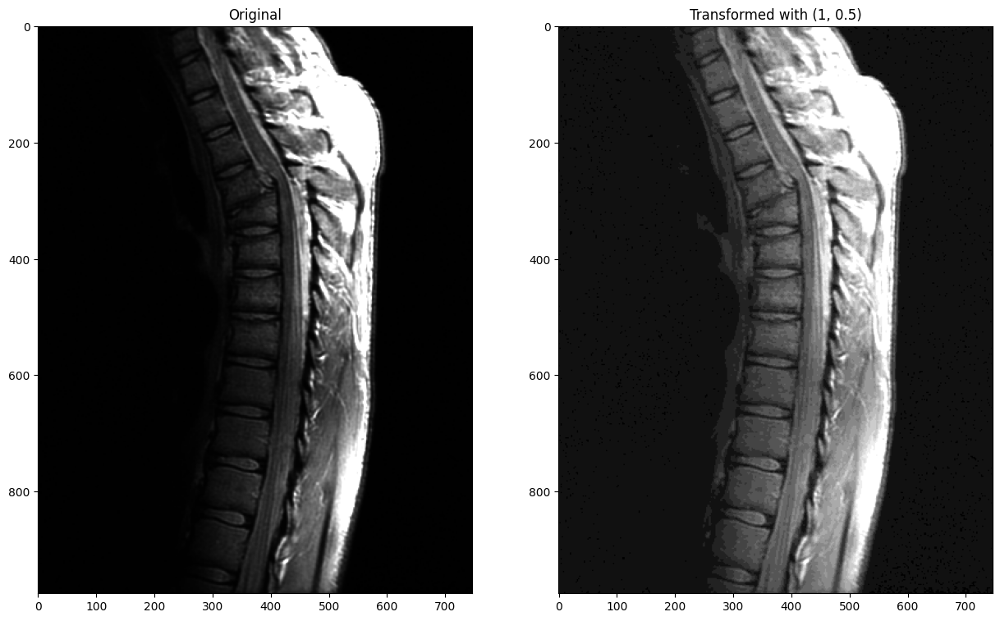

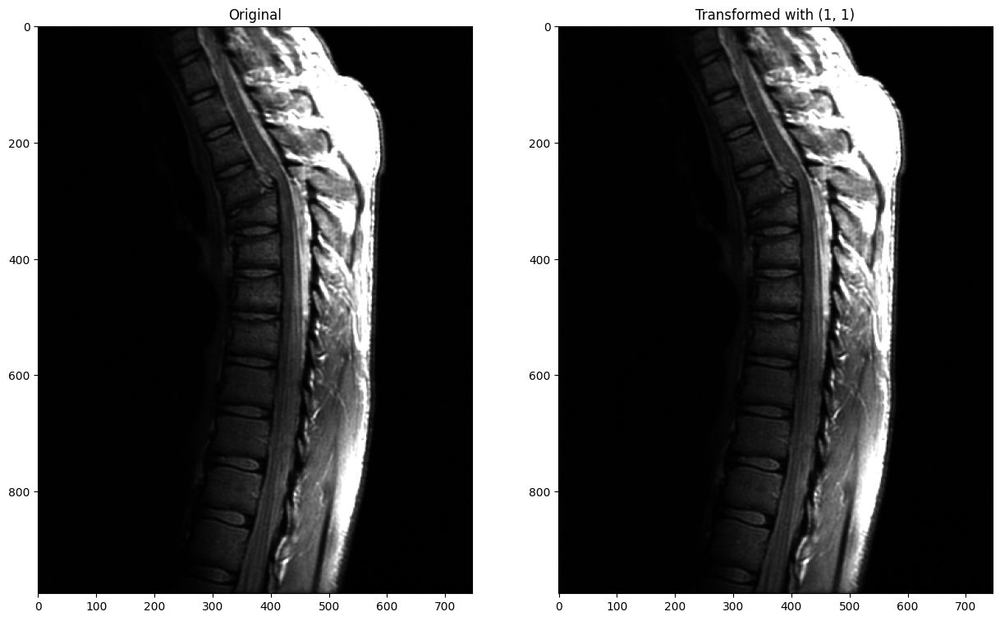

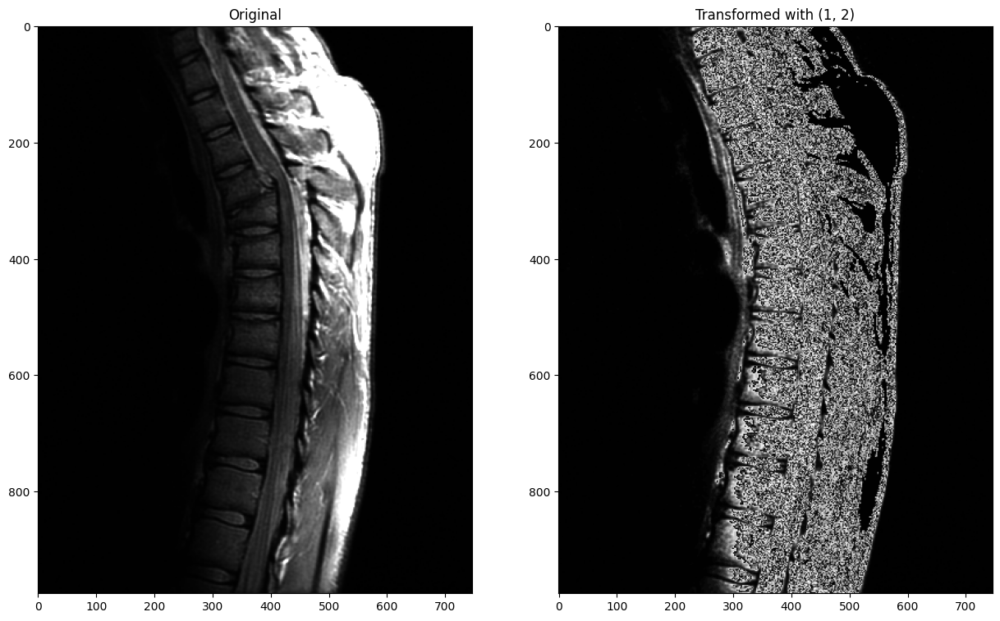

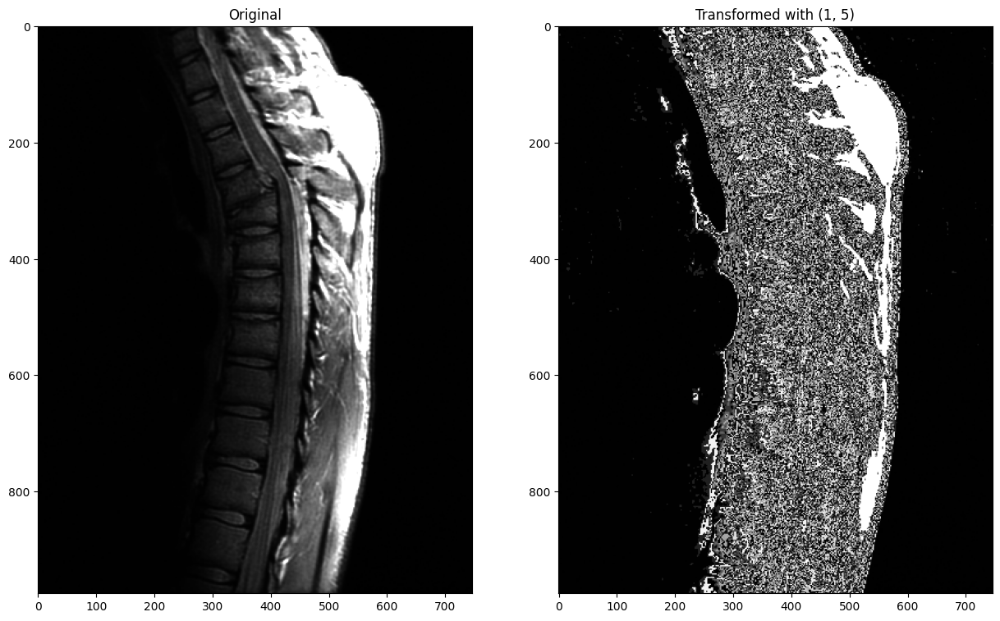

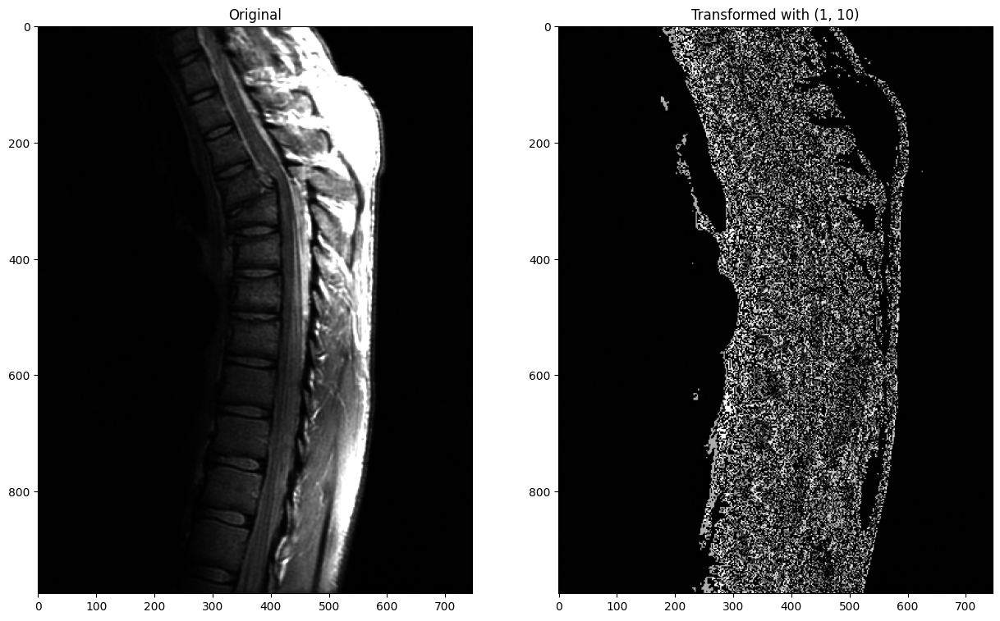

In [5]:
#testando valores de gamma = 0.1, 0.5, 1, 2, 5, 10 para fig_3_8
for value in [0.1, 0.5, 1, 2, 5, 10]:
    process(fig_3_8, apply_gamma_transformation, 1, value)

3. Implemente a representação de cada plano de bits das imagens

A representação de cada plano de bits é dada da seguinte forma para cada pixel da imagem:
<br>
<center>
$g(x, y) = f(x, y) \& 2^{n}$
</center>

Onde.
  - $n$ é o número do bit que se deseja extrair.
  - $f(x, y)$ é o valor do pixel na posição $(x, y)$ da imagem original.
  - $g(x, y)$ é o valor do pixel na posição $(x, y)$ da imagem transformada.

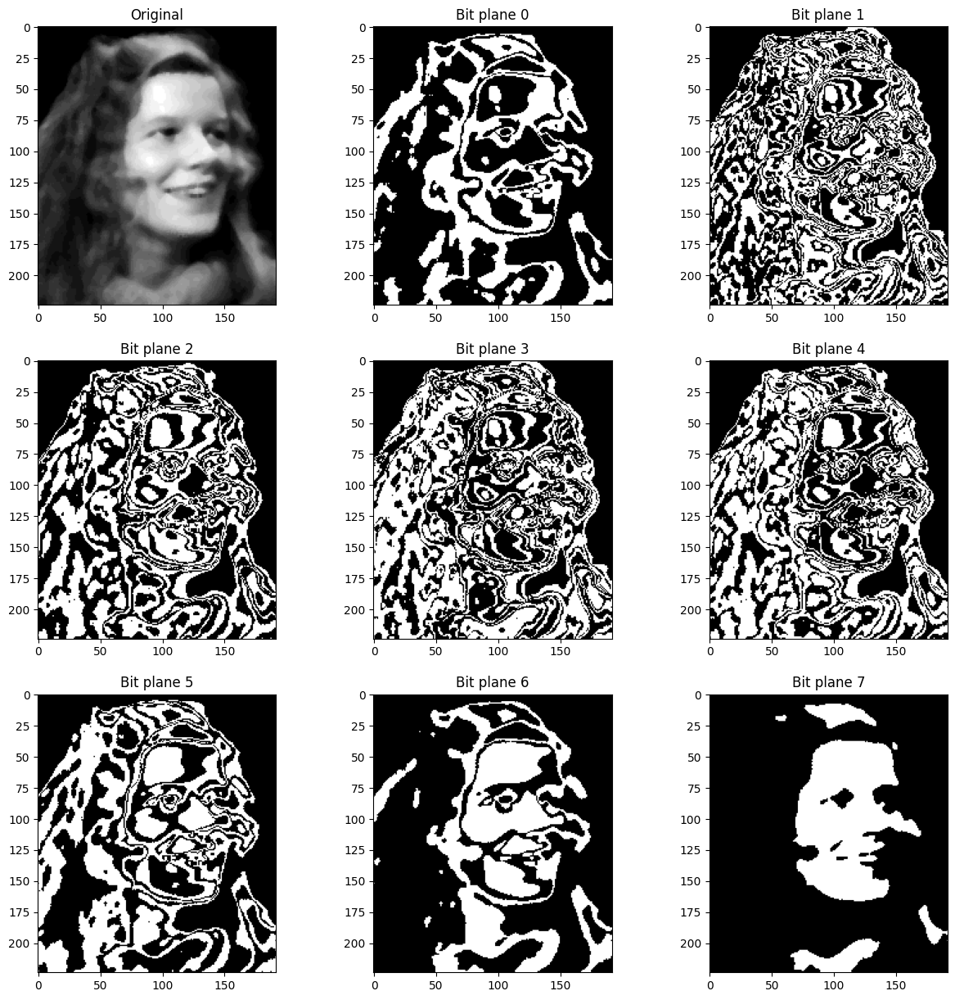

In [6]:
def get_bit_plane(img, bit):
    img = np.array(img)

    # extract n bit layer
    img = np.bitwise_and(img, 2 ** bit)

    # normalize
    img = img / 2 ** bit

    return img


plt.figure(figsize=(15, 15))

# equalize image
enhance_me = np.array(enhance_me)
enhance_me = (enhance_me - enhance_me.min()) / (enhance_me.max() - enhance_me.min()) * 255
enhance_me = Image.fromarray(enhance_me.astype(np.uint8))

plt.subplot(3, 3, 1)
plt.imshow(enhance_me, cmap='gray')
plt.title('Original')

for bit in range(8):
    plt.subplot(3, 3, bit + 2)
    plt.imshow(get_bit_plane(enhance_me, bit), cmap='gray')
    plt.title('Bit plane {}'.format(bit))

plt.show()

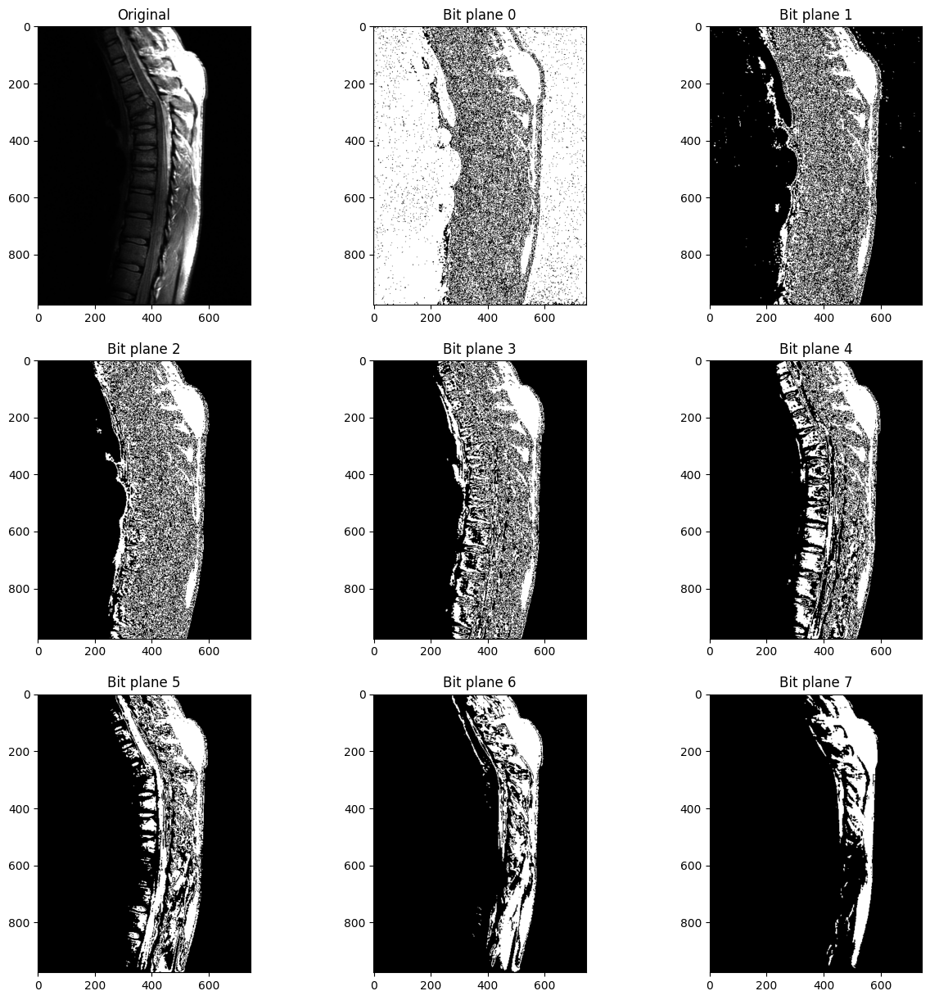

In [7]:
plt.figure(figsize=(15, 15))

plt.subplot(3, 3, 1)
plt.imshow(fig_3_8, cmap='gray')
plt.title('Original')

for bit in range(8):
    plt.subplot(3, 3, bit + 2)
    plt.imshow(get_bit_plane(fig_3_8, bit), cmap='gray')
    plt.title('Bit plane {}'.format(bit))

4. Implementar a equalização do histograma

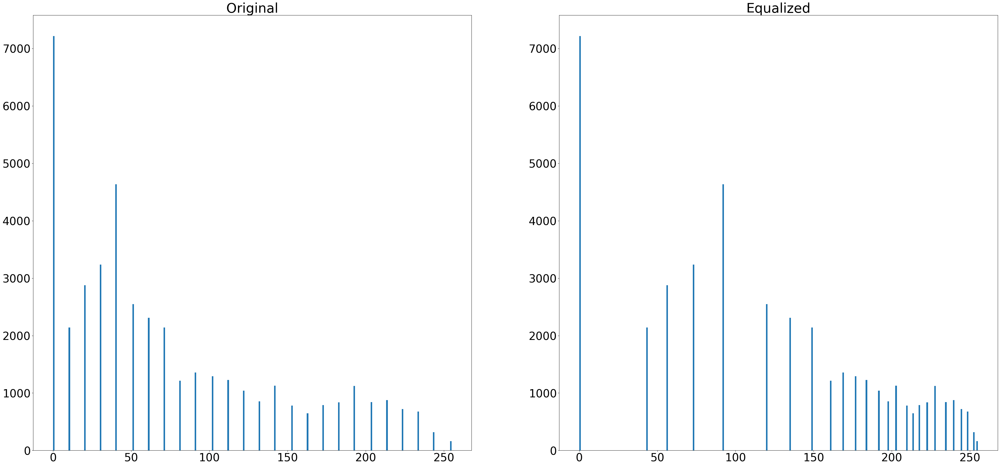

In [37]:
from PIL import ImageOps


def equalize_histogram(img):
    # plot image
    img1 = np.array(img)

    plt.figure(figsize=(50, 50))
    plt.rcParams.update({'font.size': 32})

    # plot histogram
    plt.subplot(2, 2, 1)
    plt.hist(img1.ravel(), bins=256, range=(0, 255))
    plt.title('Original' )

    # equalize histogram
    img = ImageOps.equalize(img)
    img = np.array(img)

    # plot equalized image
    plt.subplot(2, 2, 2)
    plt.hist(img.ravel(), bins=256,  range=(0, 255))
    plt.title('Equalized')

    plt.show()


equalize_histogram(enhance_me)

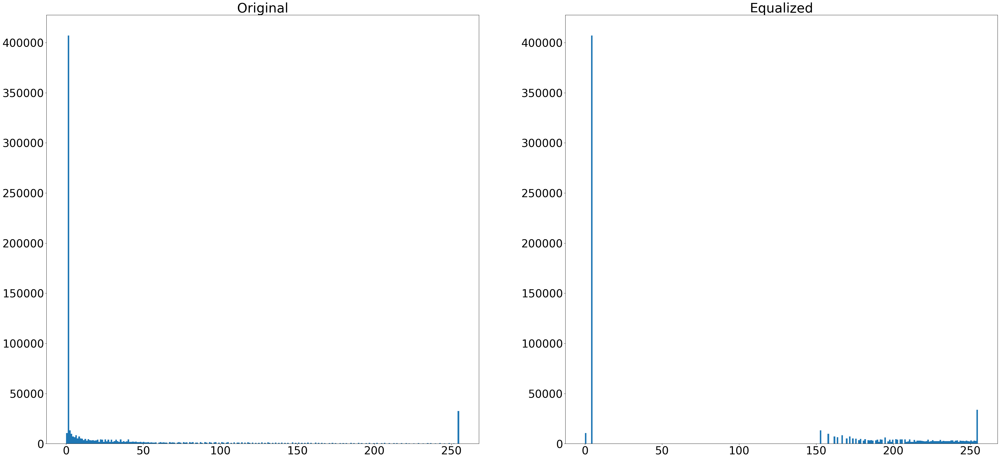

In [38]:
equalize_histogram(fig_3_8)